<a href="https://colab.research.google.com/github/MUNTADHERHAZIM/weeb-----------------------/blob/main/Object_detection_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Увеличение урожайности путем борьбы с сорняками

Сорняки являются нежелательными вторжениями в сельскохозяйственном бизнесе. Нам необходимо обнаружить сорняки и культуры с использованием модели YOLOV8.

Здесь мы можем загрузить набор данных, используя функцию wget, и распаковать загруженный файл, используя функцию unzip:

In [ ]:
# Загрузка набора данных Выполняется загрузка архива с набором данных "Weed Detection" с помощью команды wget.
!wget "https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip"

--2024-03-29 23:21:35--  https://s3-ap-southeast-1.amazonaws.com/he-public-data/Weed_Detection5a431d7.zip
Resolving s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)... 52.219.36.82, 52.219.184.64, 52.219.129.84, ...
Connecting to s3-ap-southeast-1.amazonaws.com (s3-ap-southeast-1.amazonaws.com)|52.219.36.82|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 83058744 (79M) [binary/octet-stream]
Saving to: ‘Weed_Detection5a431d7.zip’

Weed_Detection5a431 100%[===================>]  79.21M  49.2MB/s    in 1.6s    

2024-03-29 23:21:36 (49.2 MB/s) - ‘Weed_Detection5a431d7.zip’ saved [83058744/83058744]



# Распаковка архива
Выполняется распаковка загруженного архива "Weed_Detection5a431d7.zip" с помощью команды !unzip.

In [ ]:
!unzip '/content/Weed_Detection5a431d7.zip'

Archive:  /content/Weed_Detection5a431d7.zip
   creating: data/
  inflating: data/agri_0_1020.jpeg   
  inflating: data/agri_0_1020.txt    
  inflating: data/agri_0_1026.jpeg   
  inflating: data/agri_0_1028.jpeg   
  inflating: data/agri_0_1041.txt    
  inflating: data/agri_0_106.jpeg    
  inflating: data/agri_0_106.txt     
  inflating: data/agri_0_1068.jpeg   
  inflating: data/agri_0_1068.txt    
  inflating: data/agri_0_1079.jpeg   
  inflating: data/agri_0_1082.txt    
  inflating: data/agri_0_1083.jpeg   
  inflating: data/agri_0_1083.txt    
  inflating: data/agri_0_1094.jpeg   
  inflating: data/agri_0_1095.jpeg   
  inflating: data/agri_0_1123.jpeg   
  inflating: data/agri_0_1129.txt    
  inflating: data/agri_0_113.jpeg    
  inflating: data/agri_0_1130.txt    
  inflating: data/agri_0_114.txt     
  inflating: data/agri_0_1140.txt    
  inflating: data/agri_0_1146.jpeg   
  inflating: data/agri_0_1146.txt    
  inflating: data/agri_0_1166.jpeg   
  inflating: data/agri_0

# Установка библиотеки Ultralytics
Данная команда используется для установки библиотеки Ultralytics. Библиотека Ultralytics предоставляет инструменты для обучения и использования моделей глубокого обучения, в том числе YOLO (You Only Look Once).

Установка производится с помощью команды %pip install ultralytics, где %pip - это магическая команда в Jupyter Notebook, которая позволяет установить пакеты Python прямо в текущем сеансе блокнота. Ultralytics - это название устанавливаемой библиотеки.

После выполнения этой команды в блокноте будет доступна библиотека Ultralytics для использования в дальнейших ячейках блокнота.

https://docs.ultralytics.com/

In [ ]:
%pip install ultralytics

  Using cached ultralytics-8.1.37-py3-none-any.whl (723 kB)
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)


# Установка библиотеки split-folders
Эта команда используется для установки библиотеки split-folders. Библиотека split-folders предоставляет инструменты для разделения датасетов на обучающий, валидационный и тестовый наборы.

Установка производится с помощью магической команды *%pip install split-folders* в Jupyter Notebook. После установки библиотеки split-folders можно использовать ее функции для разделения датасетов на указанные наборы.

In [ ]:
%pip install split-folders

1. Импортирует необходимые библиотеки для работы с файлами и изображениями.
2. Использует функцию `glob.glob()` для поиска всех файлов с расширением .jpeg в указанном пути.
3. Проверяет, есть ли как минимум 5 изображений в найденных файлах.
4. Если найдено как минимум 5 изображений, создает фигуру для размещения подграфиков с помощью `plt.figure()`.
5. Проходит по первым пяти изображениям и отображает их в виде подграфиков с помощью `plt.imshow()`.
6. Отображает результаты, если количество изображений достаточно, и выводит сообщение об ошибке в противном случае.

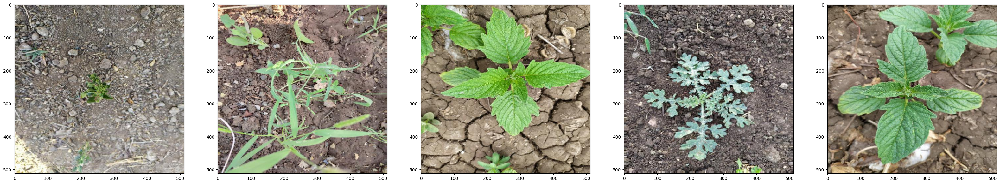

In [ ]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Импорт библиотек для работы с файлами и изображениями

# Найти все файлы .jpeg в указанном пути
jpeg_files = glob.glob('/content/data/*.jpeg')

# Проверить, есть ли как минимум 5 изображений
if len(jpeg_files) >= 5:
    # Создать фигуру для размещения подграфиков
    fig = plt.figure(figsize=(40,20))  # Регулируем высоту и ширину фигуры по необходимости

    # Пройти по первым десяти изображениям в полученном списке
    for i in range(5):
        img = plt.imread(jpeg_files[i])
        # Добавить подграфик (расположенный в 1 строке и 5 столбцах)
        ax = fig.add_subplot(1, 5, i+1)
        ax.imshow(img)
    plt.show()

else:
    print("В указанном пути меньше 5 изображений.")


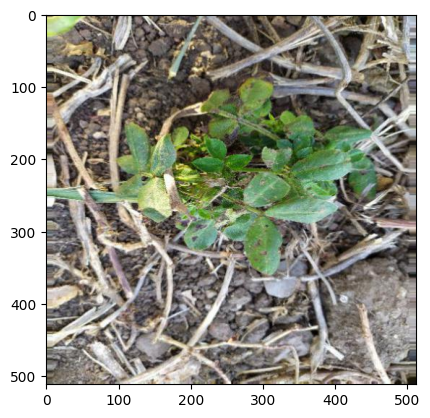

In [ ]:
img2 = plt.imread('/content/data/agri_0_6891.jpeg')
plt.imshow(img2)

#Import necessary libraries

In [ ]:
# Импорт необходимых библиотек
import os # - os: для работы с файловой системой
import shutil # - shutil: для выполнения операций копирования и перемещения файлов и папок
import math # - math: для выполнения математических операций
import numpy as np # - numpy as np: для работы с массивами и выполнения вычислений
from ultralytics import YOLO # - from ultralytics import YOLO: импорт класса YOLO из библиотеки ultralytics для работы с моделью обнаружения объектов




#Separate the Image and text file
In the Dataset images and labels in a same folder we must have separate it.

In [ ]:
def separate_files(srclocation, deslocation, type_ofImage):
    """
    Функция для разделения файлов из одного расположения в другое по типу изображений.

    Аргументы:
    srclocation (str): Путь к исходному расположению файлов.
    deslocation (str): Путь к целевому расположению файлов.
    type_ofImage (str): Тип изображения для фильтрации.

    Возвращаемое значение:
    None
    """
    # Проверка наличия папки для целевого расположения
    if not os.path.exists("./" + deslocation):
        os.mkdir(deslocation)

    # Получение списка файлов с заданным типом изображения
    files = [t for t in os.listdir(srclocation) if type_ofImage in t.lower()]
    append_path = []
    srclocation = srclocation + '/'

    # Формирование полного пути к файлам
    for txt in files:
        temp = srclocation + (txt)
        append_path.append(temp)

    # Перемещение файлов в целевую папку
    for image in append_path:
        newpath = deslocation + "/"
        shutil.move(image, newpath)


Применение функции separate_files будет осуществлять разделение файлов с расширением .jpeg из папки /content/data в папку images/.

In [ ]:
separate_files('/content/data','images/','.jpeg')

Функция separate_files разделит файлы с расширением .txt из папки /content/data и переместит их в папку labels.

In [ ]:
separate_files('/content/data','labels','.txt')

Эти строки кода перемещают папки `labels` и `images` из `/content` внутрь папки `data`.


In [ ]:
shutil.move('/content/labels','/content/data')
shutil.move('/content/images','/content/data')

'/content/data/images'

Этот код использует библиотеку splitfolders для разделения содержимого папки `/content/data` на обучающий, валидационный и тестовый наборы данных. Обучающий набор составляет `70%` от исходных данных, валидационный и тестовый - по `15%` и `15%` каждый. Разделение выполняется с учетом указанного семени (seed), без префиксов групп (group_prefix), и без перемещения файлов (move=False).

In [ ]:
import splitfolders
splitfolders.ratio('/content/data','output',seed=1337,ratio=(.7,.15,.15),group_prefix=None,move=False)

Copying files: 2600 files [00:00, 5549.00 files/s]


Этот код создает список `testImageCount`, содержащий имена файлов изображений в папке '/content/output/test/images'.

In [ ]:
testImageCount = [f for f in os.listdir('/content/data/images')]

In [ ]:
print("количество файлов изображений",len(testImageCount)) # Этот код возвращает количество файлов изображений в переменной `testImageCount`.

количество файлов изображений 1300


Этот код создает список файлов меток в переменной `testLabelCount`, которые находятся в папке '/content/output/test/labels'.

In [ ]:
testLabelCount = [f for f in os.listdir('/content/data/labels')]

In [ ]:
print("количество файлов меток",len(testLabelCount)) # Этот код возвращает количество файлов меток в переменной `testLabelCount`, которые находятся в папке '/content/output/test/labels'.


количество файлов меток 1300


Этот код загружает предварительно обученную модель YOLO из файла "yolov8n.pt".


In [ ]:
model = YOLO("yolov8n.pt") # Загрузка предварительно обученной модели YOLOv8n

100%|██████████| 6.23M/6.23M [00:00<00:00, 23.4MB/s]


#Custom dataset detection

 In a custom data detection we have to create a YAML file.If need more details  about the Yaml file the details avaliable in readme.md file

In [ ]:
# Обучение модели на данных, указанных в файле 'custom.yaml' в течение 3 эпох
model.train(data='custom.yaml', epochs=3)

Ultralytics YOLOv8.1.37 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=custom.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wi

100%|██████████| 755k/755k [00:00<00:00, 4.82MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/output/train/labels... 909 images, 0 backgrounds, 0 corrupt: 100%|██████████| 909/909 [00:00<00:00, 1997.39it/s]

train: New cache created: /content/output/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/output/val/labels... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<00:00, 1915.59it/s]

val: New cache created: /content/output/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.434      2.464      1.731         42        640: 100%|██████████| 57/57 [12:04<00:00, 12.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [01:08<00:00,  9.74s/it]

                   all        195        316      0.396      0.392       0.38      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.334      1.816      1.636         59        640: 100%|██████████| 57/57 [11:46<00:00, 12.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [01:03<00:00,  9.09s/it]

                   all        195        316      0.689      0.519      0.581      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      1.333      1.704      1.598         71        640: 100%|██████████| 57/57 [11:45<00:00, 12.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:57<00:00,  8.16s/it]

                   all        195        316      0.778      0.655      0.738      0.385



3 epochs completed in 0.648 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.37 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:52<00:00,  7.55s/it]


                   all        195        316      0.776       0.65      0.738      0.385
                  crop        195        191      0.843       0.56      0.758      0.426
                  weed        195        125      0.709      0.741      0.717      0.344
Speed: 5.6ms preprocess, 236.2ms inference, 0.0ms loss, 8.8ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f6f7cf01ae0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

Этот код создает список output_images, который содержит имена всех файлов в каталоге '/content/runs/detect/train', но только те, которые имеют расширение ".jpg". Поиск выполняется независимо от регистра, чтобы включить файлы с расширениями ".jpg", ".JPG" и т. д.

In [ ]:
output_images = [t for t in os.listdir('/content/runs/detect/train') if '.jpg' in t.lower()]

Список output_images содержит имена всех файлов в каталоге '/content/runs/detect/train', которые имеют расширение ".jpg". Если вы хотите увидеть содержимое этого списка, вы можете вывести его, вызвав его в коде или в интерактивной оболочке Python.

In [ ]:
output_images

['labels.jpg',
 'val_batch2_labels.jpg',
 'val_batch2_pred.jpg',
 'train_batch2.jpg',
 'train_batch1.jpg',
 'val_batch0_pred.jpg',
 'train_batch0.jpg',
 'val_batch0_labels.jpg',
 'val_batch1_labels.jpg',
 'val_batch1_pred.jpg',
 'labels_correlogram.jpg']

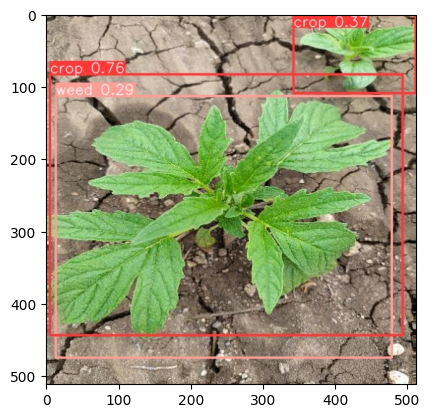

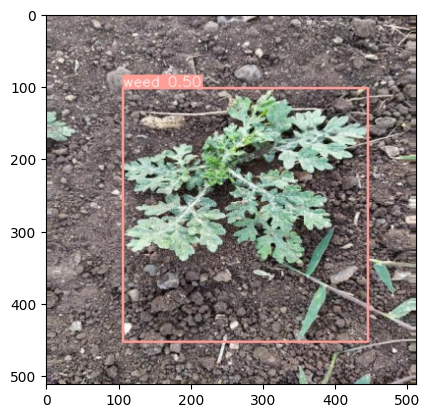

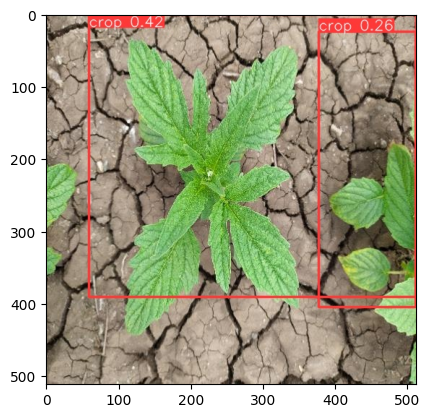

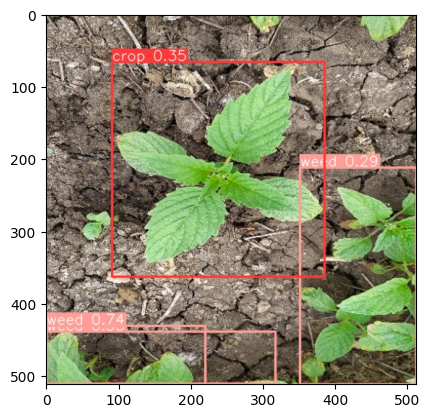

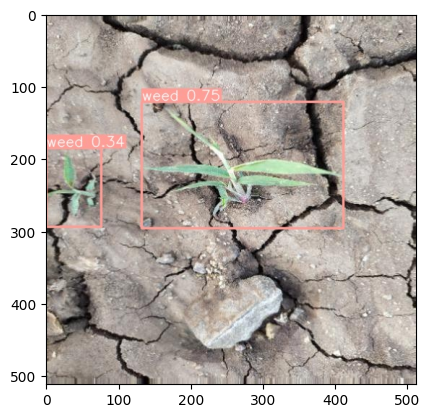

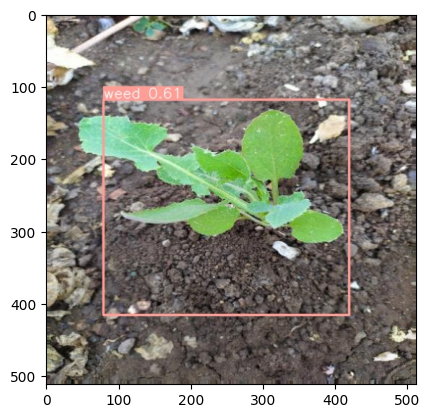

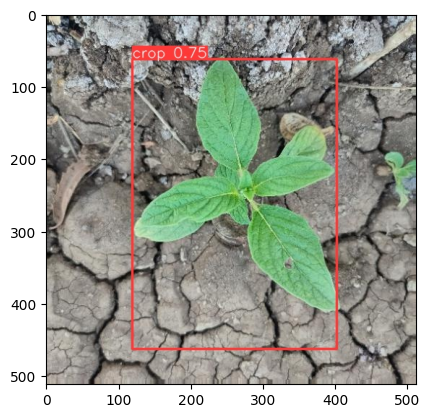

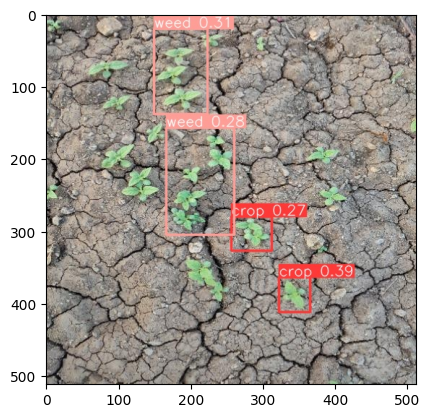

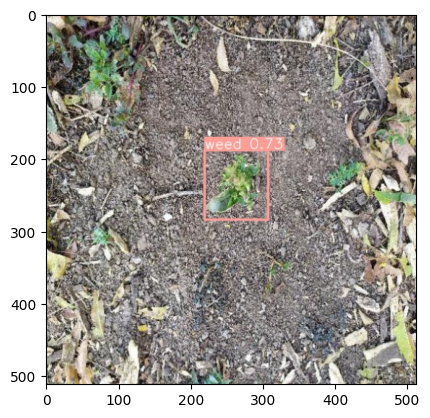

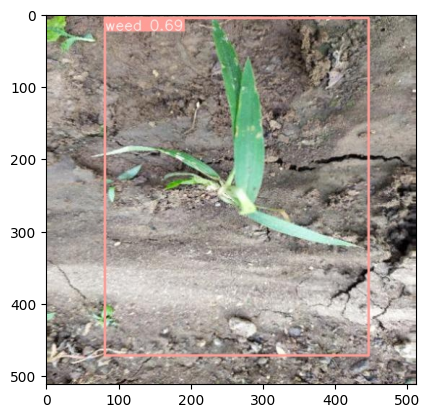

In [ ]:
predicted_image = [t for t in os.listdir('/content/runs/detect/predict') if '.jpeg' in t.lower()]
predict_path='/content/runs/detect/predict/'
sample_image=predicted_image[10:20]
for image in sample_image:
    tmp=plt.imread(predict_path+image)
    plt.imshow(tmp)
    plt.grid(False)
    plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Plt the confusion matrix, F1 ,PR,P and R curve images

In [ ]:
# Формирование списка изображений PNG в указанной директории
matrix_images = [t for t in os.listdir('/content/runs/detect/train') if '.png' in t.lower()]

`matrix_images` содержит список имен файлов изображений формата PNG, найденных в директории '/content/runs/detect/train'.

In [ ]:
matrix_images

['confusion_matrix.png',
 'P_curve.png',
 'PR_curve.png',
 'confusion_matrix_normalized.png',
 'results.png',
 'R_curve.png',
 'F1_curve.png']

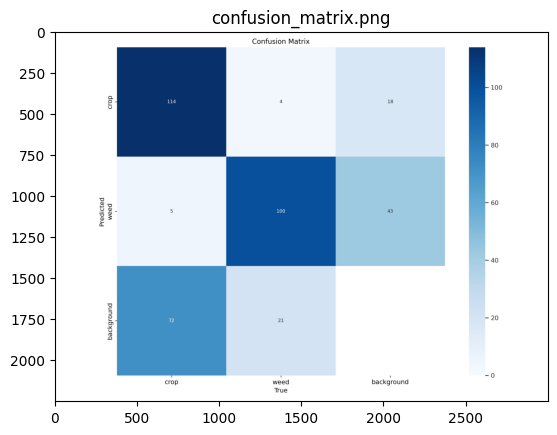

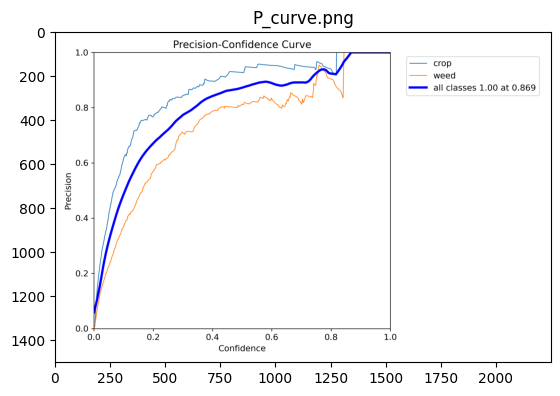

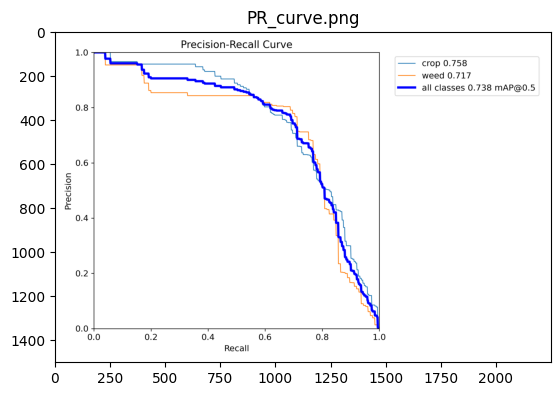

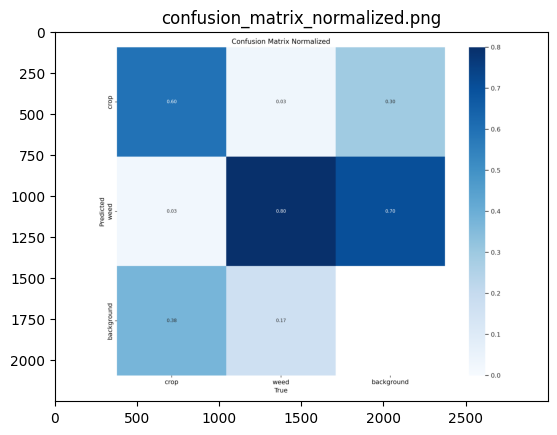

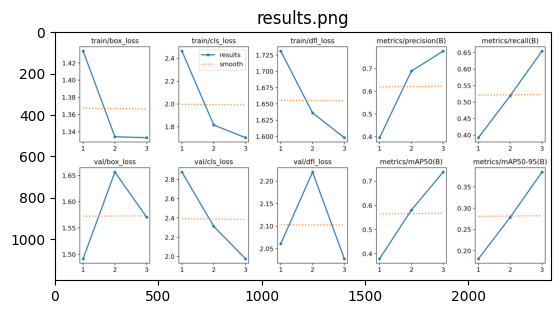

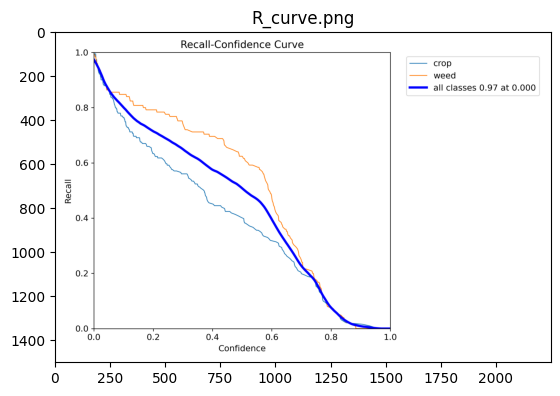

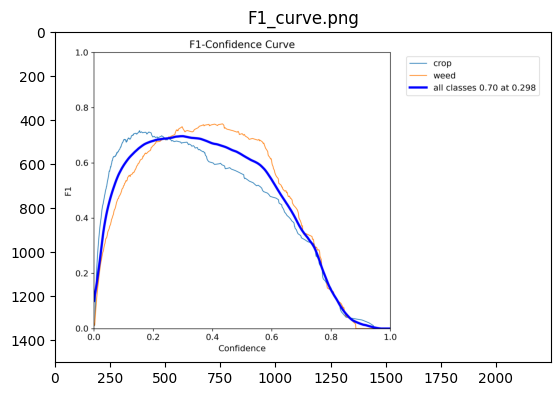

In [ ]:
main_path = '/content/runs/detect/train/'
for image in matrix_images:
  path=main_path +image
  tmp = plt.imread(path)
  plt.imshow(tmp)
  plt.title(image)
  plt.show()

#We use our own model

Once the model is generated or trained our model saved in the runs/detect/train/weights folder(best.pt).Now we can deploy our new model.

In [ ]:
model1  = YOLO('/content/runs/detect/train/weights/best.pt')

In [ ]:
model1.val()

Ultralytics YOLOv8.1.37 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/output/val/labels.cache... 195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 195/195 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:57<00:00,  4.39s/it]


                   all        195        316      0.776       0.65      0.738      0.385
                  crop        195        191      0.843       0.56      0.758      0.426
                  weed        195        125      0.709      0.741      0.717      0.344
Speed: 3.2ms preprocess, 266.1ms inference, 0.0ms loss, 10.4ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f6f768eb730>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
model1.predict(source='/content/output/test/images',save=True)


image 1/196 /content/output/test/images/agri_0_1026.jpeg: 640x640 1 crop, 243.9ms
image 2/196 /content/output/test/images/agri_0_1146.jpeg: 640x640 3 weeds, 199.2ms
image 3/196 /content/output/test/images/agri_0_1192.jpeg: 640x640 2 weeds, 196.0ms
image 4/196 /content/output/test/images/agri_0_1210.jpeg: 640x640 1 weed, 208.4ms
image 5/196 /content/output/test/images/agri_0_1211.jpeg: 640x640 1 crop, 196.6ms
image 6/196 /content/output/test/images/agri_0_1258.jpeg: 640x640 2 weeds, 196.2ms
image 7/196 /content/output/test/images/agri_0_1332.jpeg: 640x640 1 crop, 2 weeds, 198.2ms
image 8/196 /content/output/test/images/agri_0_1334.jpeg: 640x640 1 weed, 198.8ms
image 9/196 /content/output/test/images/agri_0_1420.jpeg: 640x640 3 weeds, 201.3ms
image 10/196 /content/output/test/images/agri_0_1570.jpeg: 640x640 1 weed, 204.8ms
image 11/196 /content/output/test/images/agri_0_1612.jpeg: 640x640 1 weed, 304.7ms
image 12/196 /content/output/test/images/agri_0_1677.jpeg: 640x640 4 weeds, 313.1m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'crop', 1: 'weed'}
 obb: None
 orig_img: array([[[ 49,  65,  81],
         [ 56,  72,  88],
         [ 57,  73,  89],
         ...,
         [179, 207, 224],
         [179, 209, 226],
         [178, 208, 225]],
 
        [[ 98, 114, 130],
         [100, 116, 132],
         [ 98, 114, 130],
         ...,
         [146, 174, 191],
         [139, 169, 186],
         [134, 164, 181]],
 
        [[100, 116, 132],
         [101, 117, 133],
         [103, 119, 135],
         ...,
         [178, 205, 225],
         [182, 212, 231],
         [181, 211, 230]],
 
        ...,
 
        [[ 11,  11,  29],
         [  9,  11,  29],
         [  2,   5,  20],
         ...,
         [ 99, 112, 128],
         [ 98, 111, 127],
         [100, 113, 129]],
 
        [[ 23,  21,  40],
         [ 27,  27,  45],
         [ 26,  26,  42],
         ...,
         

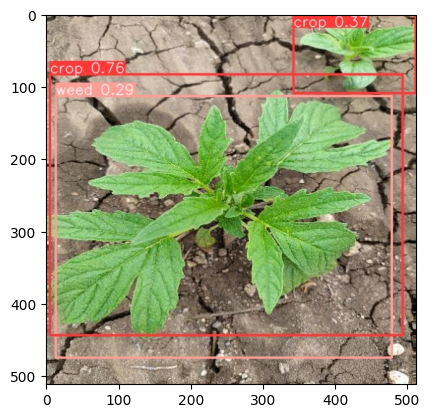

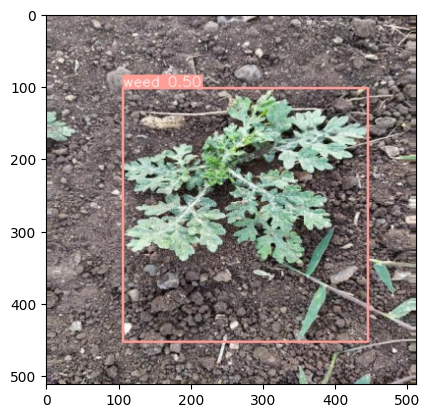

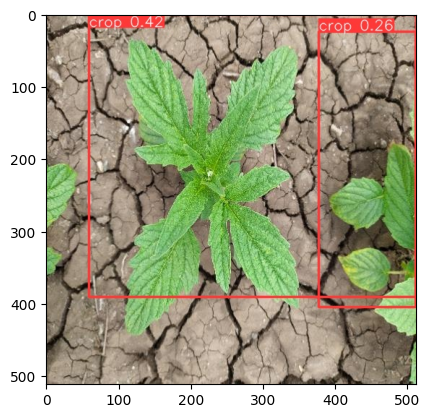

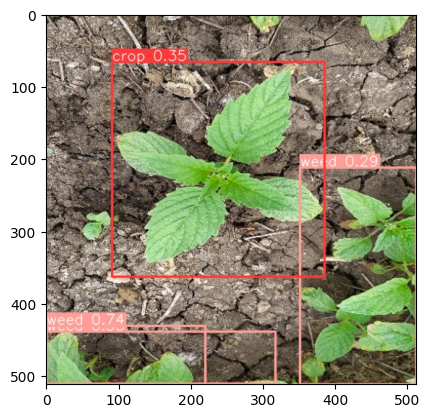

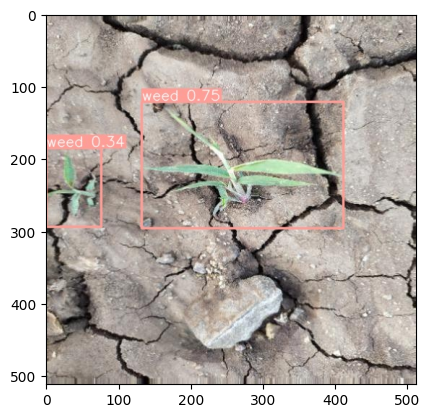

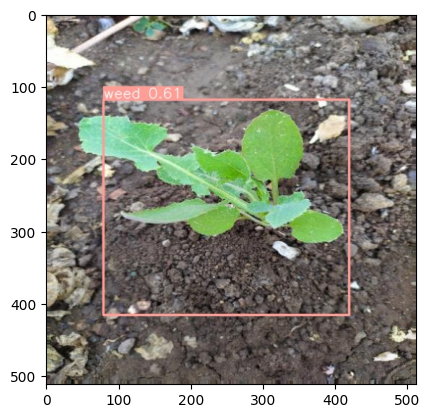

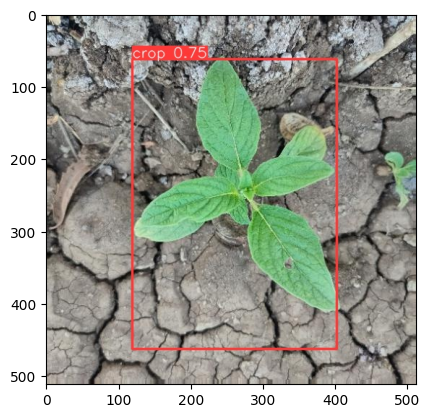

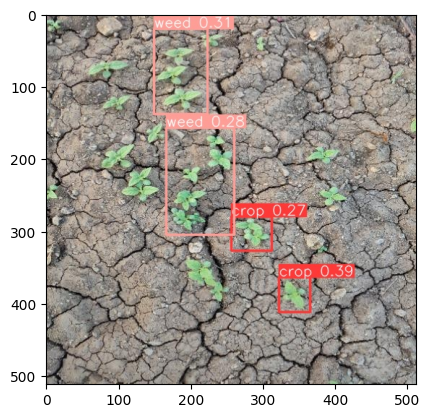

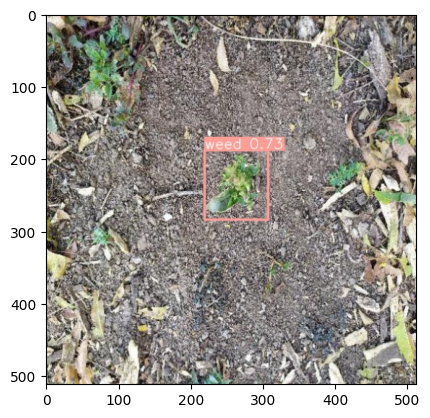

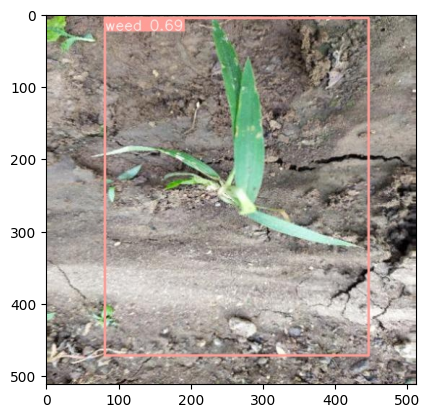

In [ ]:
predicted_image = [t for t in os.listdir('/content/runs/detect/predict') if '.jpeg' in t.lower()]
predict_path='/content/runs/detect/predict/'
sample_image=predicted_image[10:20]
for image in sample_image:
    tmp=plt.imread(predict_path+image)
    plt.imshow(tmp)
    plt.grid(False)
    plt.show()